<a href="https://colab.research.google.com/github/JEYASRII/ALPR/blob/main/AutomaticLicensePlateRecognitionSystem.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
!git reset --hard 886f1c03d839575afecb059accf74296fad395b6

Cloning into 'yolov5'...
remote: Enumerating objects: 13702, done.
remote: Counting objects: 100% (19/19), done.
remote: Compressing objects: 100% (15/15), done.
remote: Total 13702 (delta 8), reused 9 (delta 4), pack-reused 13683
Receiving objects: 100% (13702/13702), 12.18 MiB | 29.27 MiB/s, done.
Resolving deltas: 100% (9571/9571), done.
/content/yolov5
HEAD is now at 886f1c0 DDP after autoanchor reorder (#2421)


In [ ]:
# install dependencies as necessary
!pip install -qr requirements.txt  # install dependencies (ignore errors)
import torch

from IPython.display import Image, clear_output  # to display images
from utils.google_utils import gdrive_download  # to download models/datasets

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

     |████████████████████████████████| 596 kB 6.9 MB/s 
Setup complete. Using torch 1.11.0+cu113 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15109MB, multi_processor_count=40)


In [ ]:
#follow the link below to get your download code from from Roboflow
!pip install -q roboflow
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="roboflow-yolov5")

     |████████████████████████████████| 145 kB 7.3 MB/s 
     |████████████████████████████████| 178 kB 65.8 MB/s 
     |████████████████████████████████| 1.1 MB 67.4 MB/s 
     |████████████████████████████████| 67 kB 6.9 MB/s 
     |████████████████████████████████| 54 kB 2.5 MB/s 
     |████████████████████████████████| 138 kB 70.1 MB/s 
     |████████████████████████████████| 63 kB 2.0 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.27.1 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.
upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=roboflow-yolov5


In [ ]:
%cd /content
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="IeszVgXe3X8p7GChN8Ar")
project = rf.workspace("anikadatasets").project("alprdataset")
dataset = project.version(1).download("yolov5")

/content
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to alprdataset-1 in yolov5pytorch:: 100%|██████████| 2732/2732 [00:01<00:00, 1727.14it/s]


In [ ]:
!curl -L "https://app.roboflow.com/ds/FIgMc9rJep?key=lm2Hcw0cIT" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   888  100   888    0     0   1964      0 --:--:-- --:--:-- --:--:--  1964
100 35.4M  100 35.4M    0     0  43.2M      0 --:--:-- --:--:-- --:--:--  353M
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/07e787a7-6cc3-482c-9ce5-f0ce115b47f1___new_VW-Polo-GT-TSI-badges-on-the-boot-lid-jpg_jpeg.rf.e92df5087f4a6a76f72f6daeeb366ef1.jpg  
 extracting: test/images/11832b13-d514-4f1d-967c-d00e76d21e9b___Yellow-Number-Plate-With-Black-Lettering-jpg_jpeg.rf.a95e7c6d03ec9ba16e236bb0b71f8fcc.jpg  
 extracting: test/images/12b7ea40074d3b20_jpg.rf.d0cd220aa59662cbbd8d7aa0cb640793.jpg  
 extracting: test/images/140e8d10ff02e7e7_jpg.rf.ed18a79f73d903d01228bbb5b7751ab2.jpg  
 extracting: 

In [ ]:
# this is the YAML file Roboflow wrote for us that we're loading into this notebook with our data
%cat data.yaml

train: ../train/images
val: ../valid/images

nc: 2
names: ['license-plate', 'vehicle']

In [ ]:
# define number of classes based on YAML
import yaml
with open("data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [ ]:
num_classes

'2'

In [ ]:
#this is the model configuration we will use for our tutorial 
%cat /content/yolov5/models/yolov5m.yaml

# parameters
nc: 80  # number of classes
depth_multiple: 0.67  # model depth multiple
width_multiple: 0.75  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, C3, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C

In [ ]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
%%writetemplate /content/yolov5/models/custom_yolov5m.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [ ]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 32 --epochs 300 --data '../data.yaml' --cfg ./models/custom_yolov5m.yaml --weights '' --name yolov5m_results  --cache

/content/yolov5
github: ⚠️ WARNING: code is out of date by 1081 commits. Use 'git pull' to update or 'git clone https://github.com/ultralytics/yolov5' to download latest.
YOLOv5 v4.0-126-g886f1c0 torch 1.11.0+cu113 CUDA:0 (Tesla T4, 15109.75MB)

Namespace(adam=False, batch_size=32, bucket='', cache_images=True, cfg='./models/custom_yolov5m.yaml', data='../data.yaml', device='', entity=None, epochs=300, evolve=False, exist_ok=False, global_rank=-1, hyp='data/hyp.scratch.yaml', image_weights=False, img_size=[416, 416], linear_lr=False, local_rank=-1, log_artifacts=False, log_imgs=16, multi_scale=False, name='yolov5m_results', noautoanchor=False, nosave=False, notest=False, project='runs/train', quad=False, rect=False, resume=False, save_dir='runs/train/yolov5m_results', single_cls=False, sync_bn=False, total_batch_size=32, weights='', workers=8, world_size=1)
wandb: Install Weights & Biases for YOLOv5 logging with 'pip install wandb' (recommended)
Start Tensorboard with "tensorboard --lo

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

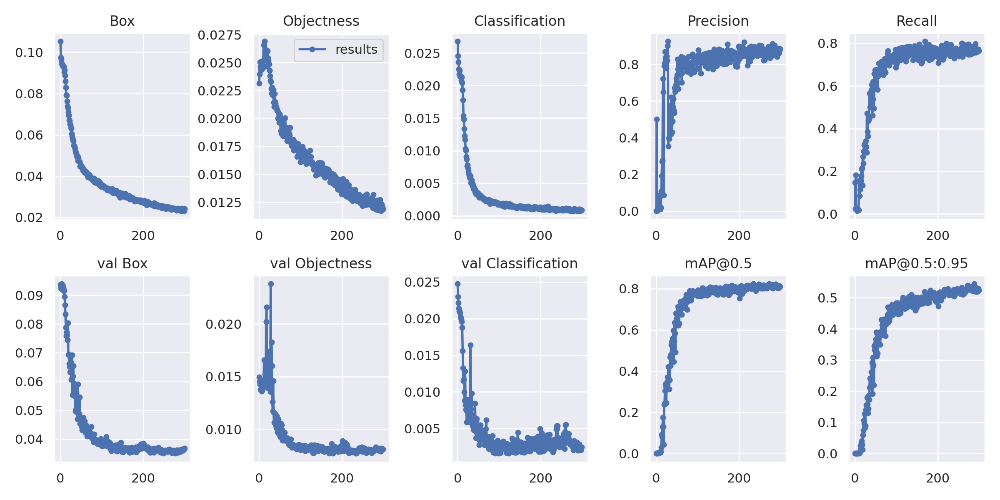

In [ ]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason... 
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/yolov5m_results/results.png', width=1000)  # view results.png

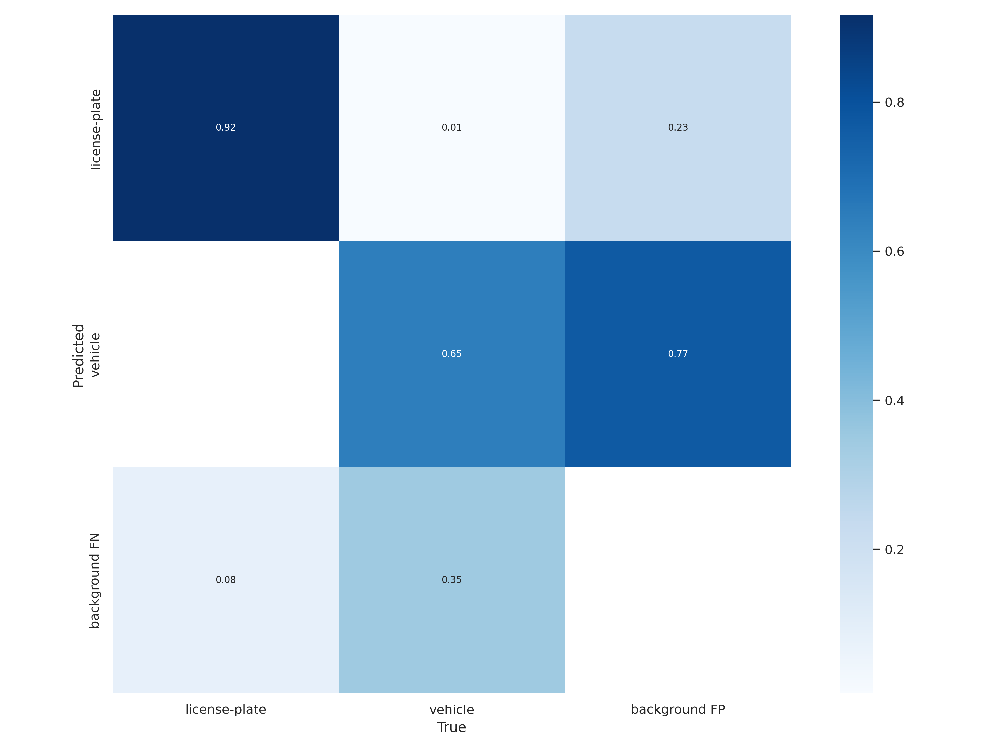

In [ ]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason... 
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/yolov5m_results/confusion_matrix.png', width=1000)  

GROUND TRUTH TRAINING DATA:


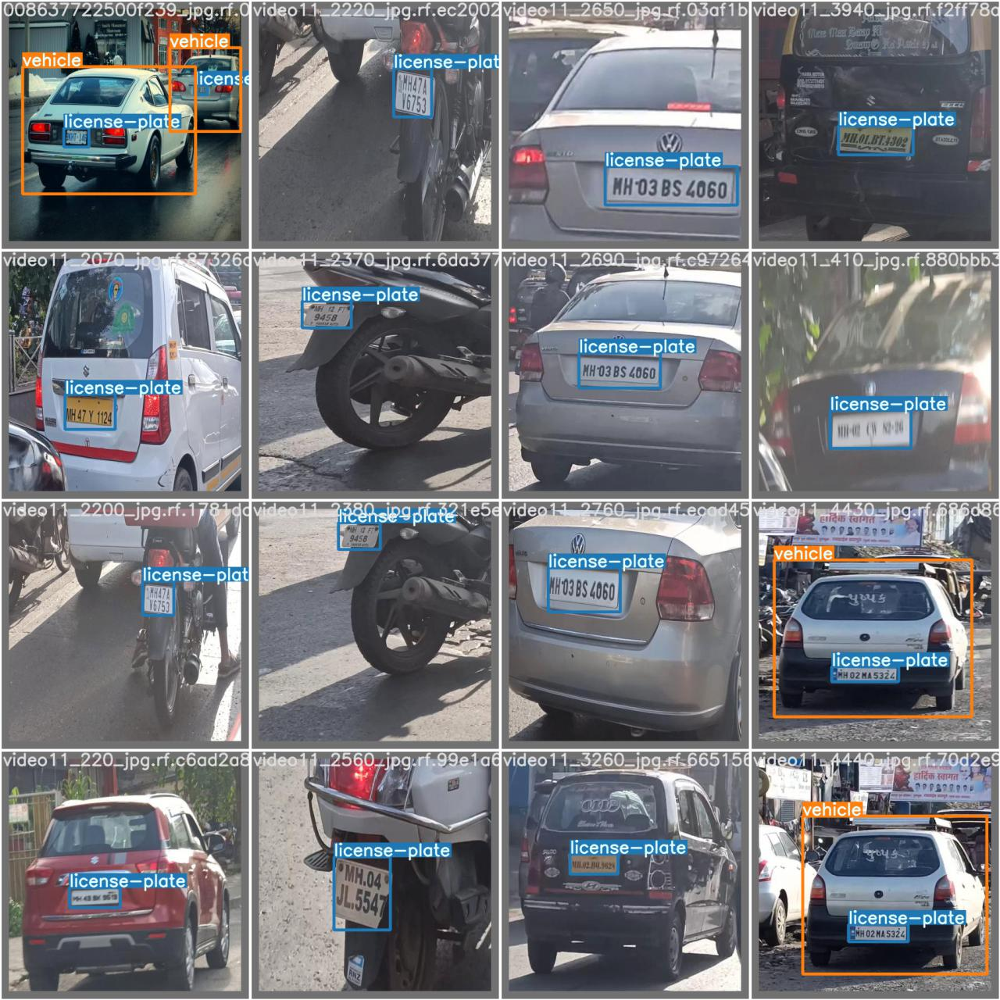

In [ ]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5m_results/test_batch0_labels.jpg', width=900)

GROUND TRUTH TRAINING DATA:


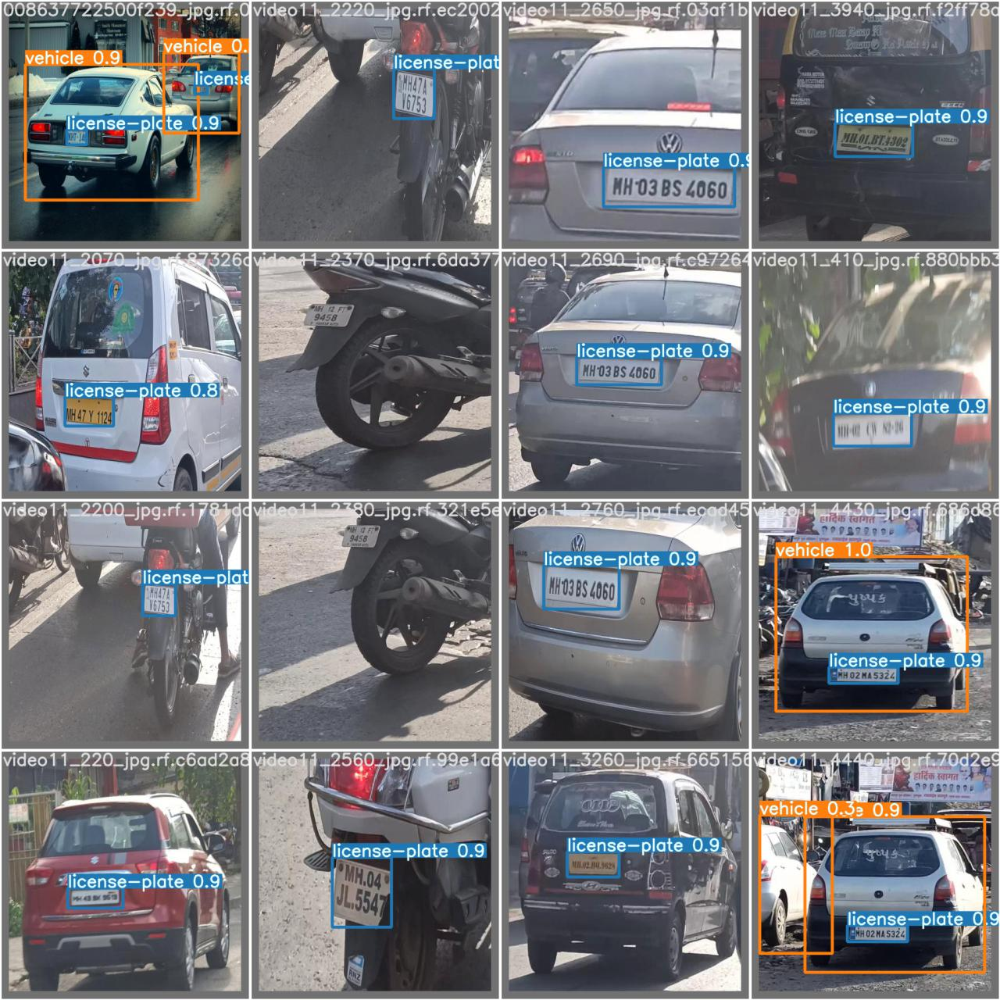

In [ ]:
# next, display our predicted label data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5m_results/test_batch0_pred.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


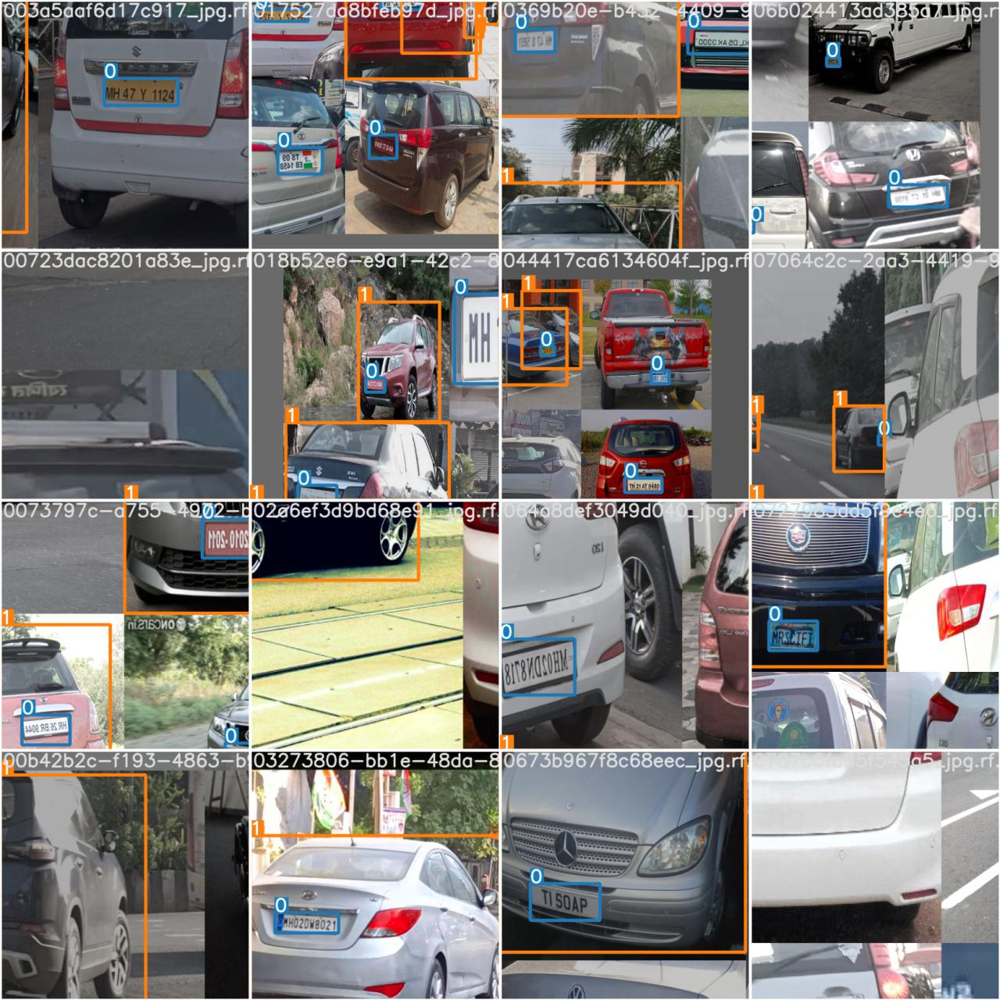

In [ ]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5m_results/train_batch0.jpg', width=900)

In [ ]:
# trained weights are saved by default in our weights folder
%ls runs/

train/


In [ ]:
%ls runs/train/yolov5m_results/weights

best.pt  last.pt


In [ ]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!
%cd /content/yolov5/
!python detect.py --weights /content/yolov5/runs/train/yolov5m_results/weights/best.pt --img 416 --conf 0.4 --source ../test/images

/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', exist_ok=False, img_size=416, iou_thres=0.45, name='exp', project='runs/detect', save_conf=False, save_txt=False, source='../test/images', update=False, view_img=False, weights=['/content/yolov5/runs/train/yolov5m_results/weights/best.pt'])
YOLOv5 v4.0-126-g886f1c0 torch 1.11.0+cu113 CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
/usr/local/lib/python3.7/dist-packages/torch/functional.py:568: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2228.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Model Summary: 232 layers, 7249215 parameters, 0 gradients, 16.8 GFLOPS
image 1/70 /content/yolov5/../test/images/07e787a7-6cc3-482c-9ce5-f0ce115b47f1___new_VW-Polo-GT-TSI-badges-on-the-boot-lid-jpg_jpeg.rf.e92df5087f4a6a76f72f6daeeb366ef1.jpg: 416x416

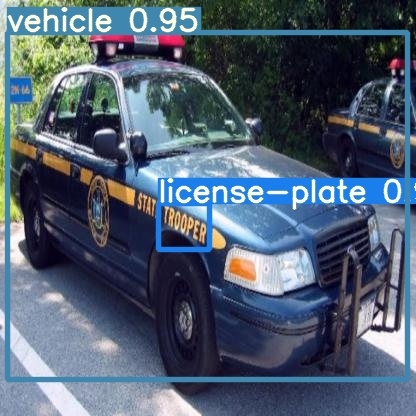

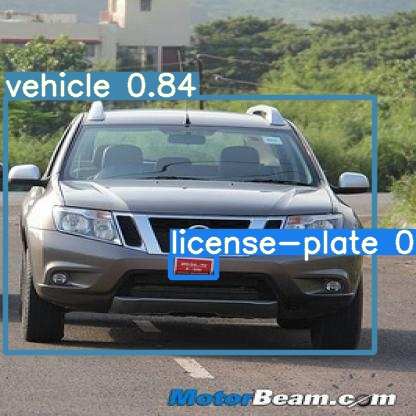

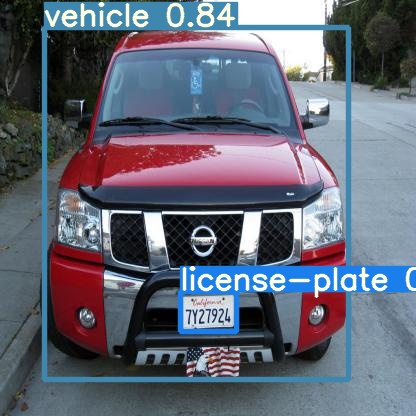

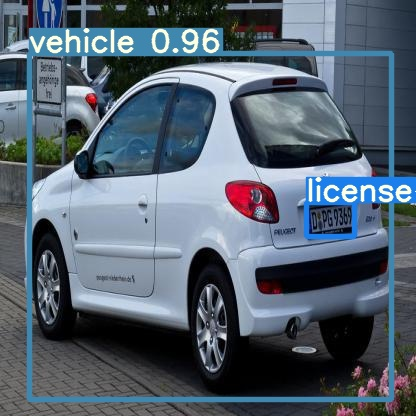

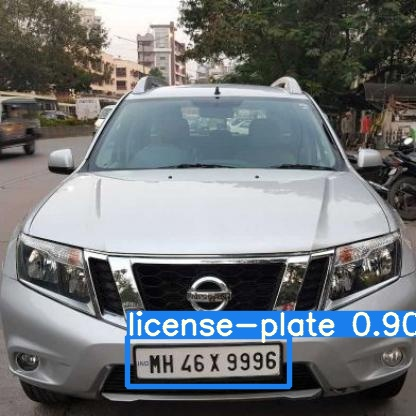

...

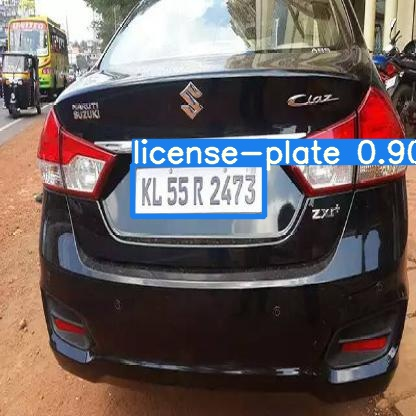

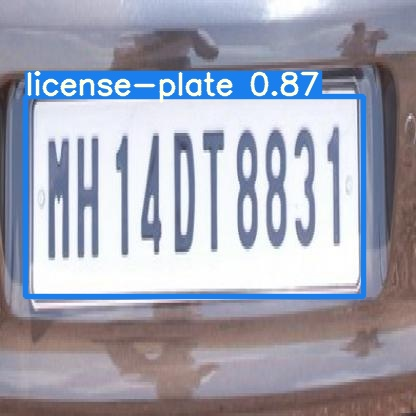

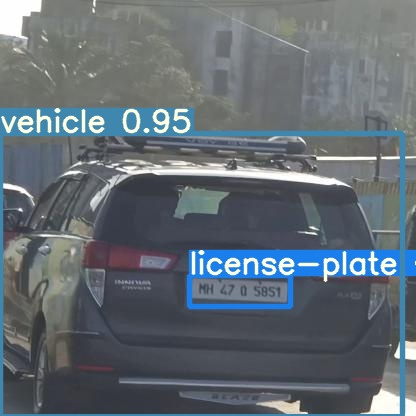

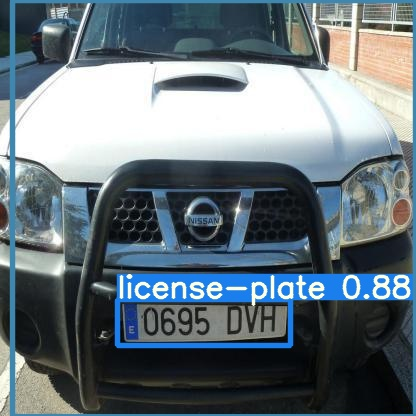

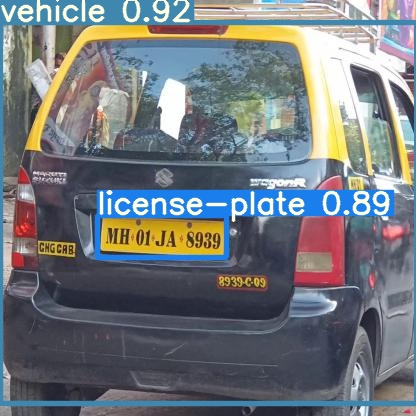

In [ ]:
#display inference on ALL test images
#this looks much better with longer training above

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
#%cp /content/yolov5/runs/train/yolov5m_results/weights/best.pt /content/gdrive/My\ Drive
%cp /content/yolov5/runs/train/yolov5m_results/weights/best.pt /content/gdrive/My\ Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd /content/yolov5/
!python detect.py --weights /content/yolov5/runs/train/yolov5m_results/weights/best.pt --img 416 --conf 0.4 --source /content/yolov5/final_test

/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', exist_ok=False, img_size=416, iou_thres=0.45, name='exp', project='runs/detect', save_conf=False, save_txt=False, source='/content/yolov5/final_test', update=False, view_img=False, weights=['/content/yolov5/runs/train/yolov5m_results/weights/best.pt'])
YOLOv5 v4.0-126-g886f1c0 torch 1.11.0+cu113 CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
/usr/local/lib/python3.7/dist-packages/torch/functional.py:568: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2228.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Model Summary: 232 layers, 7249215 parameters, 0 gradients, 16.8 GFLOPS
image 1/7 /content/yolov5/final_test/GJ15CD0564.jpg: 416x416 1 license-plate, Done. (0.017s)
image 2/7 /content/yolov5/final_test/KL55R2473.jpg: 416x416 1 license-plate

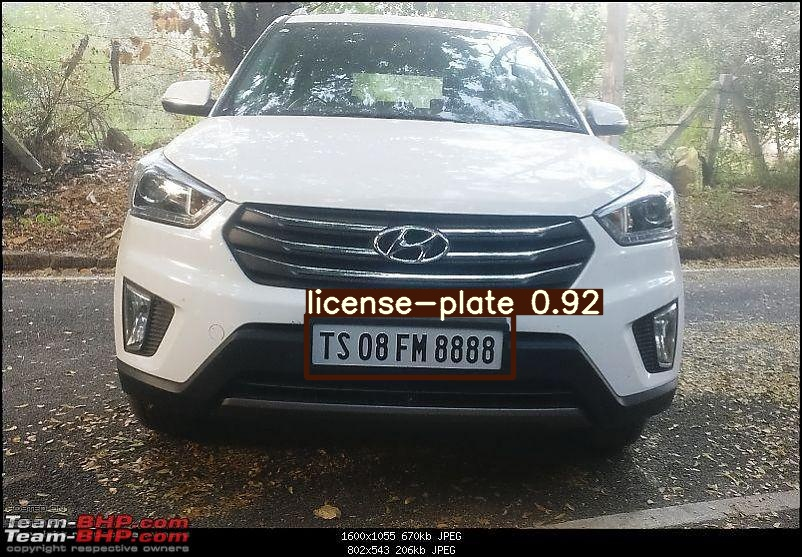

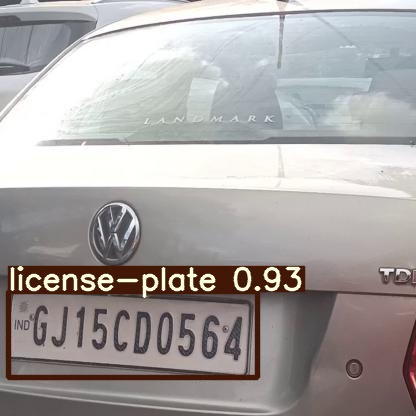

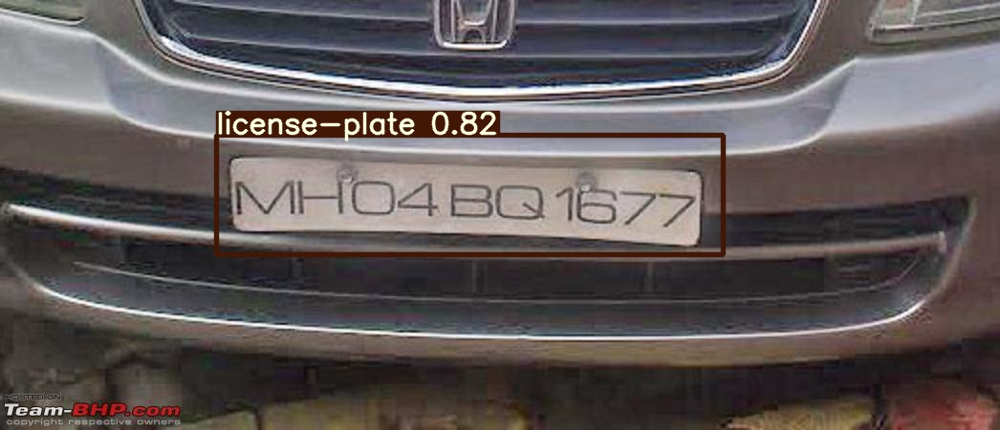

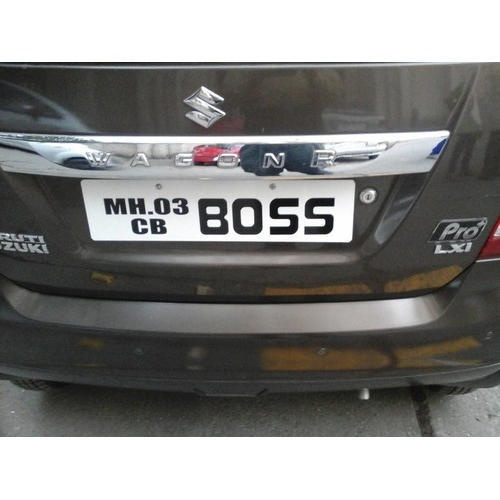

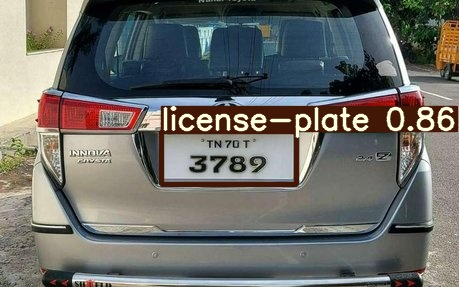

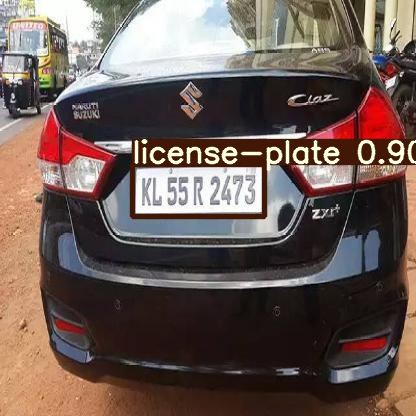

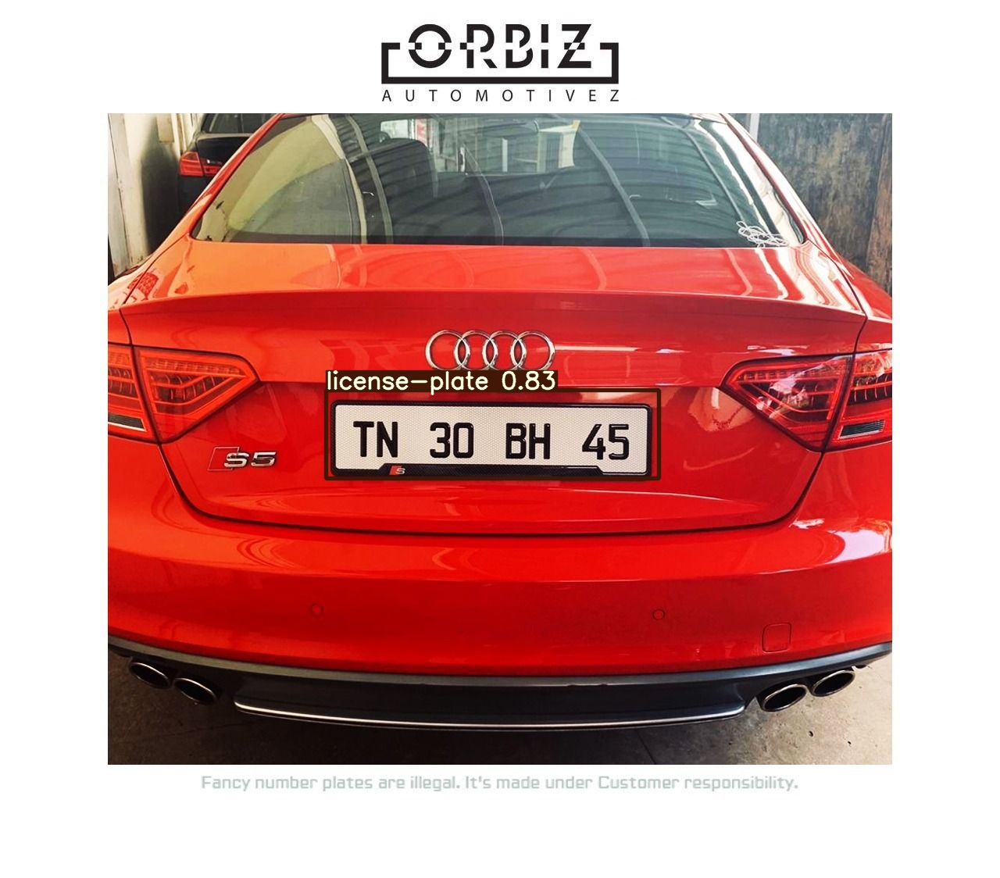

In [ ]:
#display inference on ALL test images
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp4/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [ ]:
# use --save txt
%cd /content/yolov5/
!python detect.py --weights /content/yolov5/runs/train/yolov5m_results/weights/best.pt --img 416 --conf 0.4 --source /content/yolov5/final_test --save-txt

/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', exist_ok=False, img_size=416, iou_thres=0.45, name='exp', project='runs/detect', save_conf=False, save_txt=True, source='/content/yolov5/final_test', update=False, view_img=False, weights=['/content/yolov5/runs/train/yolov5m_results/weights/best.pt'])
YOLOv5 v4.0-126-g886f1c0 torch 1.11.0+cu113 CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
/usr/local/lib/python3.7/dist-packages/torch/functional.py:568: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2228.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Model Summary: 232 layers, 7249215 parameters, 0 gradients, 16.8 GFLOPS
image 1/7 /content/yolov5/final_test/GJ15CD0564.jpg: 416x416 1 license-plate, Done. (0.018s)
image 2/7 /content/yolov5/final_test/KL55R2473.jpg: 416x416 1 license-plate,

In [ ]:
# we modified and added some line in detect.py file according to our requirement..
#refer this https://github.com/ultralytics/yolov5/issues/2608#issuecomment-809094537

%cd /content/yolov5/
!python detect1.py --weights /content/yolov5/runs/train/yolov5m_results/weights/best.pt --img 416 --conf 0.4 --source /content/yolov5/final_test 

/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', exist_ok=False, img_size=416, iou_thres=0.45, name='exp', project='runs/detect', save_conf=False, save_txt=False, source='/content/yolov5/final_test', update=False, view_img=False, weights=['/content/yolov5/runs/train/yolov5m_results/weights/best.pt'])
YOLOv5 v4.0-126-g886f1c0 torch 1.11.0+cu113 CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
/usr/local/lib/python3.7/dist-packages/torch/functional.py:568: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2228.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Model Summary: 232 layers, 7249215 parameters, 0 gradients, 16.8 GFLOPS
image 1/7 /content/yolov5/final_test/GJ15CD0564.jpg: test_images/results/GJ15CD0564.jpg
There is no detected object
416x416 1 license-plate, Done. (0.017s)
image 2/7 /c

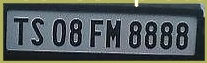

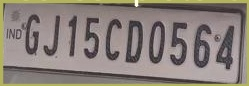

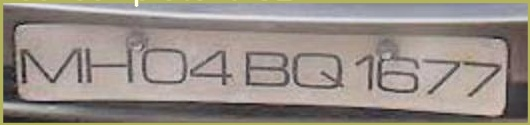

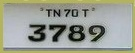

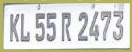

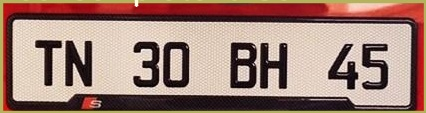

In [ ]:
#display inference on ALL test images
#this looks much better with longer training above

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/test_images/results/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [ ]:
!pip install pytesseract

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!sudo apt install tesseract-ocr

Reading package lists... Done
Building dependency tree       
Reading state information... Done
tesseract-ocr is already the newest version (4.00~git2288-10f4998a-2).
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'sudo apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 42 not upgraded.


In [ ]:
import pytesseract
import cv2

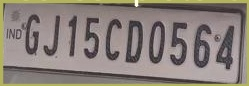

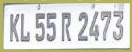

KLS55R 2473



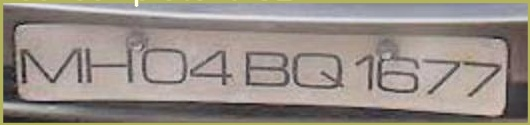

MHOA BQ i677



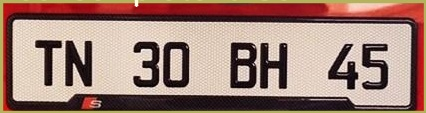

TN_30_BH



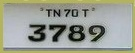

“TN70T*

_ 3789

 



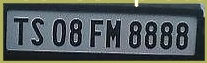

TS 08 FM 8888



In [ ]:
from IPython.display import Image, display
display(Image('/content/yolov5/test_images/results/GJ15CD0564.jpg'))
text1 = pytesseract.image_to_string("/content/yolov5/test_images/results/GJ15CD0564.jpg")
print(text1)
display(Image('/content/yolov5/test_images/results/KL55R2473.jpg'))
text2 = pytesseract.image_to_string("/content/yolov5/test_images/results/KL55R2473.jpg")
print(text2)
display(Image('/content/yolov5/test_images/results/MH04BQ1677.jpg'))
text4 = pytesseract.image_to_string("/content/yolov5/test_images/results/MH04BQ1677.jpg")
print(text4)
display(Image('/content/yolov5/test_images/results/TN30BH45.jpg'))
text5 = pytesseract.image_to_string("/content/yolov5/test_images/results/TN30BH45.jpg")
print(text5)
display(Image('/content/yolov5/test_images/results/TN70T3789.jpg'))
text6 = pytesseract.image_to_string("/content/yolov5/test_images/results/TN70T3789.jpg")
print(text6)
display(Image('/content/yolov5/test_images/results/TS08FM8888.jpg'))
text7 = pytesseract.image_to_string("/content/yolov5/test_images/results/TS08FM8888.jpg")
print(text7)

In [ ]:
!pip install opencv-python

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# Loading the required python modules
import pytesseract # this is tesseract module
import matplotlib.pyplot as plt
import cv2 # this is opencv module
import glob
import os

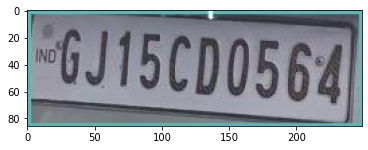

Text(0.5, 1.0, 'GJ15CD0564 license plate')

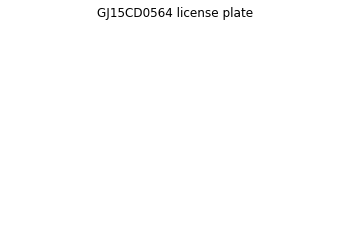

In [ ]:
path='/content/yolov5/test_images/results/GJ15CD0564.jpg'
img = cv2.imread(path)
plt.imshow(img)
plt.show()
plt.axis('off')
plt.title('GJ15CD0564 license plate')

In [ ]:
# specify path to the license plate images folder as shown below
#path_for_license_plates = os.getcwd() + "/test_images/results/*.jpg"  #/license-plates/**/*.jpg
path_for_license_plates = '/content/yolov5/test_images/results/*.jpg'
actual_lp = []
predicted_lp = []

for path_to_license_plate in glob.glob(path_for_license_plates, recursive = True):
	
	license_plate_file = path_to_license_plate.split("/")[-1]
	license_plate, _ = os.path.splitext(license_plate_file)
	actual_lp.append(license_plate)

In [ ]:
print(actual_lp)
print(predicted_lp)

['TS08FM8888', 'GJ15CD0564', 'MH04BQ1677', 'TN70T3789', 'KL55R2473', 'TN30BH45']
[]


In [ ]:
from google.colab.patches import cv2_imshow

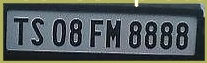

License Plate Number   :   TS08FM8888


In [ ]:
path='/content/yolov5/test_images/results/TS08FM8888.jpg'
img = cv2.imread(path)
cv2_imshow(img) 
grey_image = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
#cv2_imshow(grey_image)
blur = cv2.medianBlur(grey_image, 3)
#cv2_imshow(blur)
resized = cv2.resize(blur, None, fx=2, fy=2, interpolation=cv2.INTER_NEAREST)
#cv2_imshow(resized)
thresh = cv2.threshold(resized, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
#cv2_imshow(thresh)
predicted_result = pytesseract.image_to_string(thresh, lang='eng',config='--oem 3  --psm 7 -c tessedit_char_whitelist=ABCDEFGHIJKLMNOPQRSTUVWXYZ0123456789')
filter_predicted_result = "".join(predicted_result.split()).replace(":", "").replace("-", "")
new_res =  "".join(str for str in filter_predicted_result.strip() if str.isalnum())
print('License Plate Number   :   ' +new_res)
predicted_lp.append(new_res)

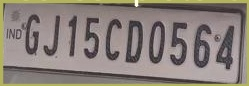

License Plate Number   :   GJ15CD0564


In [ ]:
path='/content/yolov5/test_images/results/GJ15CD0564.jpg'
img = cv2.imread(path)
cv2_imshow(img) 
grey_image = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
#cv2_imshow(grey_image)
blur = cv2.medianBlur(grey_image, 3)
#cv2_imshow(blur)
resized = cv2.resize(blur, None, fx=6, fy=5, interpolation=cv2.INTER_CUBIC)
#cv2_imshow(resized)
thresh = cv2.threshold(resized, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
#cv2_imshow(thresh)
predicted_result = pytesseract.image_to_string(thresh, lang='eng',config='--oem 3  --psm 7 -c tessedit_char_whitelist=ABCDEFGHIJKLMNOPQRSTUVWXYZ0123456789')
filter_predicted_result = "".join(predicted_result.split()).replace(":", "").replace("-", "")
new_res =  "".join(str for str in filter_predicted_result.strip() if str.isalnum())
print('License Plate Number   :   ' +new_res)
predicted_lp.append(new_res)

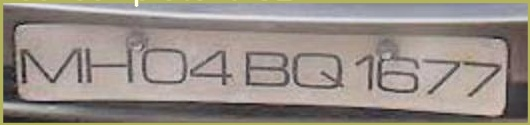

License Plate Number   :   MHO4BQ1677


In [ ]:
path='/content/yolov5/test_images/results/MH04BQ1677.jpg'
img = cv2.imread(path)
cv2_imshow(img) 
grey_image = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
#cv2_imshow(grey_image)
blur = cv2.medianBlur(grey_image, 3)
#cv2_imshow(blur)
resized = cv2.resize(blur, None, fx=3, fy=4, interpolation=cv2.INTER_AREA)
#cv2_imshow(resized)
thresh = cv2.threshold(resized, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
#cv2_imshow(thresh)
predicted_result = pytesseract.image_to_string(thresh, lang='eng',config='--oem 3  --psm 7 -c tessedit_char_whitelist=ABCDEFGHIJKLMNOPQRSTUVWXYZ0123456789')
filter_predicted_result = "".join(predicted_result.split()).replace(":", "").replace("-", "")
new_res =  "".join(str for str in filter_predicted_result.strip() if str.isalnum())
print('License Plate Number   :   ' +new_res)
predicted_lp.append(new_res)

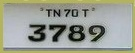

License Plate Number   :   3789


In [ ]:
path='/content/yolov5/test_images/results/TN70T3789.jpg'
img = cv2.imread(path)
cv2_imshow(img) 
grey_image = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
#cv2_imshow(grey_image)
blur = cv2.medianBlur(grey_image, 3)
#cv2_imshow(blur)
resized = cv2.resize(blur, None, fx=6, fy=5, interpolation=cv2.INTER_CUBIC)
#cv2_imshow(resized)
thresh = cv2.threshold(resized, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
#cv2_imshow(thresh)
predicted_result = pytesseract.image_to_string(thresh, lang='eng',config='--oem 3  --psm 7 -c tessedit_char_whitelist=ABCDEFGHIJKLMNOPQRSTUVWXYZ0123456789')
filter_predicted_result = "".join(predicted_result.split()).replace(":", "").replace("-", "")
new_res =  "".join(str for str in filter_predicted_result.strip() if str.isalnum())
print('License Plate Number   :   ' +new_res)
#predicted_lp.append(filter_predicted_result)
predicted_lp.append(new_res)

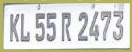

License Plate Number   :   KL55R2473


In [ ]:
path='/content/yolov5/test_images/results/KL55R2473.jpg'
img = cv2.imread(path)
cv2_imshow(img) 
grey_image = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
#cv2_imshow(grey_image)
blur = cv2.medianBlur(grey_image, 3)
#cv2_imshow(blur)
resized = cv2.resize(blur, None, fx=2, fy=1, interpolation=cv2.INTER_LINEAR)
#cv2_imshow(resized)
thresh = cv2.threshold(resized, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
#cv2_imshow(thresh)
predicted_result = pytesseract.image_to_string(thresh, lang='eng',config='--oem 3  --psm 7 -c tessedit_char_whitelist=ABCDEFGHIJKLMNOPQRSTUVWXYZ0123456789')
filter_predicted_result = "".join(predicted_result.split()).replace(":", "").replace("-", "")
new_res =  "".join(str for str in filter_predicted_result.strip() if str.isalnum())
print('License Plate Number   :   ' +new_res)
#predicted_lp.append(filter_predicted_result)
predicted_lp.append(new_res)

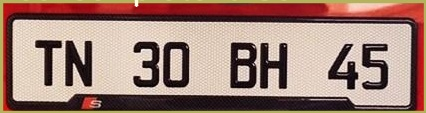

License Plate Number   :   TN30BH45


In [ ]:
path='/content/yolov5/test_images/results/TN30BH45.jpg'
img = cv2.imread(path)
cv2_imshow(img) 
grey_image = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
#cv2_imshow(grey_image)
blur = cv2.medianBlur(grey_image, 3)
#cv2_imshow(blur)
resized = cv2.resize(blur, None, fx=3, fy=1, interpolation=cv2.INTER_LINEAR)
#cv2_imshow(resized)
thresh = cv2.threshold(resized, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
#cv2_imshow(thresh)
predicted_result = pytesseract.image_to_string(thresh, lang='eng',config='--oem 3  --psm 7 -c tessedit_char_whitelist=ABCDEFGHIJKLMNOPQRSTUVWXYZ0123456789')
filter_predicted_result = "".join(predicted_result.split()).replace(":", "").replace("-", "")
new_res =  "".join(str for str in filter_predicted_result.strip() if str.isalnum())
print('License Plate Number   :   ' +new_res)
predicted_lp.append(new_res)

In [ ]:
print(actual_lp)
print(predicted_lp)

['TS08FM8888', 'GJ15CD0564', 'MH04BQ1677', 'TN70T3789', 'KL55R2473', 'TN30BH45']
['TS08FM8888', 'GJ15CD0564', 'MHO4BQ1677', '3789', 'KL55R2473', 'TN30BH45']


In [ ]:
import pandas as pd
df = pd.read_csv('/content/LPDets.csv')
print(df)

  LicensePlate  VehicleModel    OwnerName  OwnerRegNo  OwnerPhoneNo  \
0   TS08FM8888         Honda    Akash Raj   201893459    9987659032   
1   GJ15CD0564          Audi     Dev Nand   201845799    8757499302   
2   MH04BQ1677  MercedesBenz  Ashlyn Ella   201914790    5749959392   
3    TN70T3789           KIA   Chris Bang   202056789    5750204802   
4    KL55R2473       Renault  Elle Lively   202197884    8753948022   
5     TN30BH45           BMW    Felix Lee   202210159    8248022042   

  StateofRegistration  
0           Telangana  
1             Gujarat  
2         Maharashtra  
3           TamilNadu  
4              Kerala  
5           TamilNadu  


In [ ]:
import csv
import sys
number = input('Enter LP Number : \n')
csv_file = csv.reader(open('/content/LPDets.csv', "r"), delimiter=",")
list_of_column_names = list(df.columns)
for row in csv_file:
    if number == row[0]:
         print(list_of_column_names)
         print (row)

Enter LP Number : 
TN30BH45
['LicensePlate', 'VehicleModel', 'OwnerName', 'OwnerRegNo', 'OwnerPhoneNo', 'StateofRegistration']
['TN30BH45', 'BMW', 'Felix Lee', '202210159', '8248022042', 'TamilNadu']
